In [5]:
# Labels visualization for table recognition task

import os
import sys
import json
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle, Polygon, Arrow
from matplotlib.collections import PatchCollection
from PIL import Image
import xml.etree.ElementTree as ET
import glob
from collections import defaultdict
from tqdm import tqdm
from bbox import compute_ioa_batch
import multiprocessing
from multiprocessing import Process, Manager



def read_pascal_voc(xml_file: str, class_map=None):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    bboxes = []
    labels = []

    width = float(root.find('size').find('width').text)
    height = float(root.find('size').find('height').text)

    for object_ in root.iter('object'):
        ymin, xmin, ymax, xmax = None, None, None, None

        label = object_.find("name").text
        if label == 'table rotated':
            label = 'table'

        if class_map.get(label, None) is None:
            continue

        label = int(class_map[label])

        for box in object_.findall("bndbox"):
            ymin = float(box.find("ymin").text)
            xmin = float(box.find("xmin").text)
            ymax = float(box.find("ymax").text)
            xmax = float(box.find("xmax").text)

        bbox = [xmin, ymin, xmax, ymax]
        
        if bbox[2] <= bbox[0] or bbox[3] <= bbox[1]:
            print('wrong label box coordinates 1', bbox)

        bboxes.append(bbox)
        labels.append(label)

    return bboxes, labels, [width, height]



dataset_type = 'val'
dataset_path = os.path.join('pubtables-1m', 'pubtables1m', 'PubTables1M-Structure-PASCAL-VOC', dataset_type + '_xml')


class_map = {
    'table': 0,
    'table column': 1,
    'table row': 2,
    'table column header': 3,
    'table projected row header': 4,
    'table spanning cell': 5,
    'no object': 6
}

print(len(os.listdir(dataset_path)))

is_visualize = False



# for f in tqdm(os.listdir(dataset_path)):
def process_files(f):
    if f == '.ipynb_checkpoints':
        return

    file_name = f.split('.')[0]
    annotation_file_path = os.path.join(dataset_path, f)
    bboxes, labels, size = read_pascal_voc(annotation_file_path, class_map)

    image_path = os.path.join(dataset_path, '..', 'images', file_name + '.jpg')
    if not os.path.exists(image_path):
        image_path = os.path.join(dataset_path, '..', 'images', file_name + '.png')

    im = Image.open(image_path)
    json_writer = {'image_size': [im.size[0], im.size[1]], 'labels': []}

    if is_visualize:
        fig, ax = plt.subplots(figsize=(30, 15))
        ax.imshow(im)

    header_rects = []
    row_rects = []
    col_rects = []
    table_rects = []
    cell_rects = []

    row_boxes = []
    column_boxes = []
    cell_bboxes = []
    header_boxes = []
    table_boxes = []

    for idx, bbox in enumerate(bboxes):
        shift = 0
        if labels[idx] > 0:
            shift = labels[idx] + 1
        rect = Polygon(np.asarray([[bbox[0] + shift, bbox[1] + shift], [bbox[2] + shift, bbox[1] + shift],
                                   [bbox[2] + shift, bbox[3] + shift], [bbox[0] + shift, bbox[3] + shift]]).reshape(-1, 2))
        if labels[idx] == 0:
            table_rects.append(rect)
            table_boxes.append(bbox)
        elif labels[idx] == 1:
            col_rects.append(rect)
            column_boxes.append(bbox)
        elif labels[idx] == 2:
            row_rects.append(rect)
            row_boxes.append(bbox)
        elif labels[idx] == 3:
            header_rects.append(rect)
            header_boxes.append(bbox)
        elif labels[idx] == 5:
            cell_rects.append(rect)
            cell_bboxes.append(bbox)

    for table_box in table_boxes:
        json_writer['labels'].append({'name': 'table',
                                      'bbox': [table_box[0], table_box[1], table_box[2], table_box[3]]})

    ioa = compute_ioa_batch(np.asarray(cell_bboxes), np.asarray(column_boxes), max_ioa=True)
    columns_to_cells_aux = defaultdict(list)

    for span_cell_idx, span_cell in enumerate(ioa):
        if sum(span_cell > 0.1) > 1:
            # spanning cell over more columns so we can shrink the columns
            for col_idx, col in enumerate(ioa[span_cell_idx]):
                if ioa[span_cell_idx][col_idx] > 0.1:
                    is_change = False
                    if cell_bboxes[span_cell_idx][1] - 10 < column_boxes[col_idx][1]:
                        column_boxes[col_idx][1] = cell_bboxes[span_cell_idx][3]
                        is_change = True
                        # columns_to_cells_aux[col_idx].append(cell_bboxes[span_cell_idx])

                    if cell_bboxes[span_cell_idx][3] + 10 > column_boxes[col_idx][3]:
                        column_boxes[col_idx][3] = cell_bboxes[span_cell_idx][1]
                        is_change = True

                    if is_change:
                        min_y = min(column_boxes[col_idx][1], column_boxes[col_idx][3])
                        max_y = max(column_boxes[col_idx][1], column_boxes[col_idx][3])
                        column_boxes[col_idx][1] = min_y
                        column_boxes[col_idx][3] = max_y

                    columns_to_cells_aux[col_idx].append(cell_bboxes[span_cell_idx])

    col_rects = []
    for col_idx, bbox in enumerate(column_boxes):
        shift = 2
        rect = Polygon(np.asarray([[bbox[0] + shift, bbox[1] + shift], [bbox[2] + shift, bbox[1] + shift],
                                   [bbox[2] + shift, bbox[3] + shift], [bbox[0] + shift, bbox[3] + shift]]).reshape(-1, 2))
        col_rects.append(rect)

        list_of_cells_to_point = columns_to_cells_aux[col_idx]
        json_writer['labels'].append({'name': 'column',
                                      'bbox': [bbox[0], bbox[1], bbox[2], bbox[3]],
                                      'extra_cells': list_of_cells_to_point})

    is_change = True
    rows_to_cells_aux = defaultdict(list)

    while is_change:
        is_change = False
        ioa = compute_ioa_batch(np.asarray(cell_bboxes), np.asarray(row_boxes), max_ioa=True)

        for span_cell_idx, span_cell in enumerate(ioa):
            if sum(span_cell > 0.1) > 1:
                # spanning cell over more rows so we can shrink the rows
                for row_idx, row in enumerate(ioa[span_cell_idx]):
                    if ioa[span_cell_idx][row_idx] > 0.1:
                        if cell_bboxes[span_cell_idx][0] - 10 < row_boxes[row_idx][0]:
                            row_boxes[row_idx][0] = cell_bboxes[span_cell_idx][2]
                            is_change = True

                        if cell_bboxes[span_cell_idx][2] + 10 > row_boxes[row_idx][2]:
                            row_boxes[row_idx][2] = cell_bboxes[span_cell_idx][0]
                            is_change = True

                        if cell_bboxes[span_cell_idx] not in rows_to_cells_aux[row_idx]:
                            rows_to_cells_aux[row_idx].append(cell_bboxes[span_cell_idx])

    row_rects = []
    for row_idx, bbox in enumerate(row_boxes):
        min_x = min(row_boxes[row_idx][0], row_boxes[row_idx][2])
        max_x = max(row_boxes[row_idx][0], row_boxes[row_idx][2])
        row_boxes[row_idx][0] = min_x
        row_boxes[row_idx][2] = max_x
        bbox = row_boxes[row_idx]

        if bbox[0] >= bbox[2] or bbox[1] >= bbox[3]:
            # print('wrong label box coordinates 2', bbox)
            continue

        shift = 3
        rect = Polygon(np.asarray([[bbox[0] + shift, bbox[1] + shift], [bbox[2] + shift, bbox[1] + shift],
                                   [bbox[2] + shift, bbox[3] + shift], [bbox[0] + shift, bbox[3] + shift]]).reshape(-1, 2))
        row_rects.append(rect)
        list_of_cells_to_point = rows_to_cells_aux[row_idx]
        json_writer['labels'].append({'name': 'row',
                                      'bbox': [bbox[0], bbox[1], bbox[2], bbox[3]],
                                      'extra_cells': list_of_cells_to_point})


    new_header_boxes = []
    header_arrows = []
    header_rects = []

    ioa = compute_ioa_batch(np.asarray(header_boxes), np.asarray(row_boxes), max_ioa=True)
    headers_to_cells_aux = defaultdict(list)

    for header_ioa in ioa:
        if sum(header_ioa > 0.8) >= 1:
            row_idxs = np.where(header_ioa > 0.8)
            for row_idx in row_idxs[0]:
                new_header_boxes.append(row_boxes[row_idx])

                shift = 4
                bbox = row_boxes[row_idx]
                rect = Polygon(np.asarray([[bbox[0] + shift, bbox[1] + shift], [bbox[2] + shift, bbox[1] + shift],
                                           [bbox[2] + shift, bbox[3] + shift], [bbox[0] + shift, bbox[3] + shift]]).reshape(-1, 2))
                header_rects.append(rect)
                json_writer['labels'].append({'name': 'header',
                                              'bbox': [bbox[0], bbox[1], bbox[2], bbox[3]],
                                              'extra_cells': rows_to_cells_aux[row_idx]})

                headers_to_cells_aux[row_idx] = rows_to_cells_aux[row_idx]

    for cell_box in cell_bboxes:
        json_writer['labels'].append({'name': 'spanning cell',
                                      'bbox': [cell_box[0], cell_box[1], cell_box[2], cell_box[3]]})

    row_arrows = []
    header_arrows = []
    for row_idx, row in enumerate(row_boxes):
        list_of_cells_to_point = rows_to_cells_aux.get(row_idx, None)
        if list_of_cells_to_point is not None:
            for dst_cell in list_of_cells_to_point:
                if dst_cell:
                    dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                    dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                    row_x_center = (row[0] + row[2]) / 2.0
                    row_y_center = (row[1] + row[3]) / 2.0
                    arrow = Arrow(row_x_center, row_y_center,
                                  dst_cell_x_center - row_x_center,
                                  dst_cell_y_center - row_y_center)
                    row_arrows.append(arrow)

                    if headers_to_cells_aux[row_idx]:
                        header_arrows.append(arrow)

    column_arrows = []
    for column_idx, column in enumerate(column_boxes):
        list_of_cells_to_point = columns_to_cells_aux.get(column_idx, None)

        if list_of_cells_to_point is not None:
            for dst_cell in list_of_cells_to_point:
                if dst_cell:
                    dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                    dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                    column_x_center = (column[0] + column[2]) / 2.0
                    column_y_center = (column[1] + column[3]) / 2.0
                    arrow = Arrow(column_x_center, column_y_center,
                                  dst_cell_x_center - column_x_center,
                                  dst_cell_y_center - column_y_center)
                    column_arrows.append(arrow)

    with open(os.path.join(dataset_path, '..', dataset_type, file_name + '.json'), "w") as outfile:
        json.dump(json_writer, outfile)

    if is_visualize:
        ax.add_collection(PatchCollection(cell_rects, facecolor='none', edgecolor='red', linewidth=2))
        ax.add_collection(PatchCollection(table_rects, facecolor='none', edgecolor='red', linewidth=2))
        ax.add_collection(PatchCollection(row_rects, facecolor='none', edgecolor='blue', linewidth=2))
        ax.add_collection(PatchCollection(col_rects, facecolor='none', edgecolor='green', linewidth=2))
        ax.add_collection(PatchCollection(header_rects, facecolor='none', edgecolor='orange', linewidth=2))

        ax.add_collection(PatchCollection(row_arrows, facecolor='none', edgecolor='blue'))
        ax.add_collection(PatchCollection(column_arrows, facecolor='none', edgecolor='green'))
        ax.add_collection(PatchCollection(header_arrows, facecolor='none', edgecolor='orange'))



n_jobs = 32

with multiprocessing.Pool(n_jobs) as p:
    result = list(tqdm(p.imap_unordered(process_files, os.listdir(dataset_path)), total=len(os.listdir(dataset_path))))

# for _, f in enumerate(tqdm(os.listdir(dataset_path)[:20])):
#     process_files(f, is_lock=False)

print('End')


94959


100%|██████████| 94959/94959 [00:43<00:00, 2183.66it/s]


End


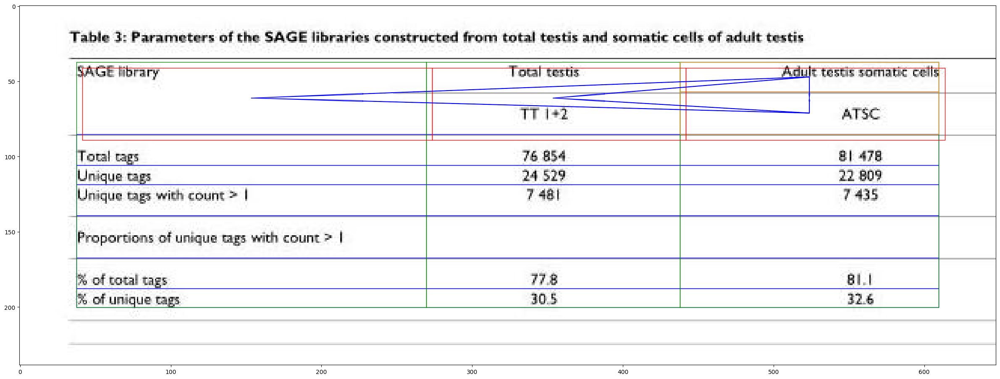

In [11]:
# labels visualization

import os
import sys
import json
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle, Polygon
from matplotlib.collections import PatchCollection
from PIL import Image
import xml.etree.ElementTree as ET
import glob
from collections import defaultdict



def read_json(json_file: str, class_map=None):
    with open(json_file, 'r') as openfile:
        data = json.load(openfile)
    width, height = data['image_size']
    bboxes = []
    labels = []
    cell_pointers = []

    for label in data['labels']:
        label_name = label['name']
        bbox = label['bbox']

        if bbox[2] <= bbox[0] or bbox[3] <= bbox[1]:
            print('wrong bbox coord', bbox)
            print(label_name)

        cell_pointer = label.get('extra_cells', None)

        if label_name == 'table rotated':
            label_name = 'table'

        if class_map.get(label_name, None) is None:
            continue

        label_id = int(class_map[label_name])
        bboxes.append(bbox)
        labels.append(label_id)
        cell_pointers.append(cell_pointer)

    return bboxes, labels, cell_pointers, [width, height]


dataset_path = os.path.join('pubtables-1m', 'pubtables1m', 'PubTables1M-Structure-PASCAL-VOC', 'val')


class_map = {'table': 0,
             'column': 1,
             'row': 2,
             'header': 3,
             'spanning cell': 4}

for f in os.listdir(dataset_path):
    if f == '.ipynb_checkpoints':
        continue
        
    if 'PMC1079818_table_2' not in f:
        continue

    file_name = f.split('.')[0]
    annotation_file_path = os.path.join(dataset_path, f)
    bboxes, labels, cell_pointers, size = read_json(annotation_file_path, class_map)

    image_path = os.path.join(dataset_path, '..', 'images', file_name + '.jpg')
    if not os.path.exists(image_path):
        image_path = os.path.join(dataset_path, '..', 'images', file_name + '.png')

    im = Image.open(image_path)
    fig, ax = plt.subplots(figsize=(30, 15))
    ax.imshow(im)
    header_rects = []
    row_rects = []
    col_rects = []
    table_rects = []
    cell_rects = []
    col_arrows = []
    row_arrows = []

    for idx, bbox in enumerate(bboxes):
        if labels[idx] == 0:
            shift = 2
        elif labels[idx] == 4:
            shift = 4
        else:
            shift = 0

        rect = Polygon(np.asarray([[bbox[0] + shift, bbox[1] + shift], [bbox[2] + shift, bbox[1] + shift],
                                   [bbox[2] + shift, bbox[3] + shift], [bbox[0] + shift, bbox[3] + shift]]).reshape(-1, 2))
        if labels[idx] == 0:
            table_rects.append(rect)
        elif labels[idx] == 1:
            col_rects.append(rect)
        elif labels[idx] == 2:
            row_rects.append(rect)
        elif labels[idx] == 3:
            header_rects.append(rect)
        elif labels[idx] == 4:
            cell_rects.append(rect)
        
        if labels[idx] == 1:
            if cell_pointers[idx]:
                for dst_cell in cell_pointers[idx]:
                    if dst_cell:
                        dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                        dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                        column_x_center = (bbox[0] + bbox[2]) / 2.0
                        column_y_center = (bbox[1] + bbox[3]) / 2.0
                        arrow = Arrow(column_x_center, column_y_center, dst_cell_x_center-column_x_center, dst_cell_y_center-column_y_center)
                        col_arrows.append(arrow)

        if labels[idx] == 2:
            if cell_pointers[idx]:
                for dst_cell in cell_pointers[idx]:
                    if dst_cell:
                        dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                        dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                        row_x_center = (bbox[0] + bbox[2]) / 2.0
                        row_y_center = (bbox[1] + bbox[3]) / 2.0
                        arrow = Arrow(row_x_center, row_y_center, dst_cell_x_center-row_x_center, dst_cell_y_center-row_y_center)
                        row_arrows.append(arrow)

    # ax.add_collection(PatchCollection(table_rects, facecolor='none', edgecolor='red'))
    ax.add_collection(PatchCollection(row_rects, facecolor='none', edgecolor='blue'))
    ax.add_collection(PatchCollection(col_rects, facecolor='none', edgecolor='green'))
    ax.add_collection(PatchCollection(header_rects, facecolor='none', edgecolor='orange'))

    ax.add_collection(PatchCollection(cell_rects, facecolor='none', edgecolor='red'))
    ax.add_collection(PatchCollection(col_arrows, facecolor='none', edgecolor='green'))
    ax.add_collection(PatchCollection(row_arrows, facecolor='none', edgecolor='blue'))

460589


100%|██████████| 10/10 [00:00<00:00, 23.20it/s]


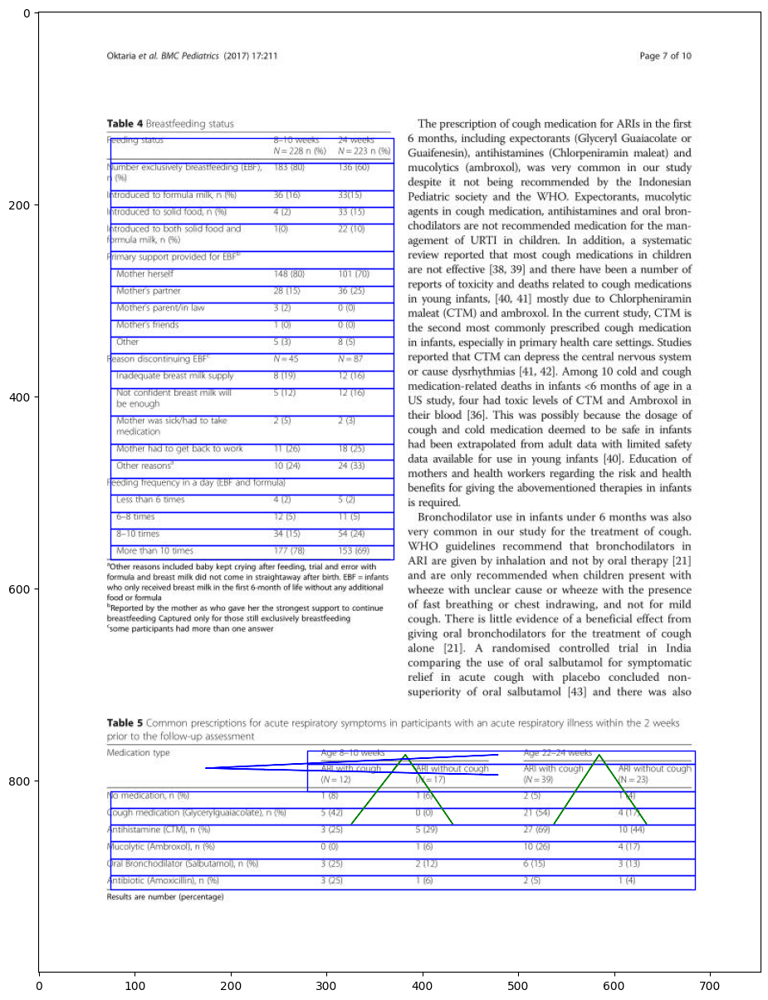

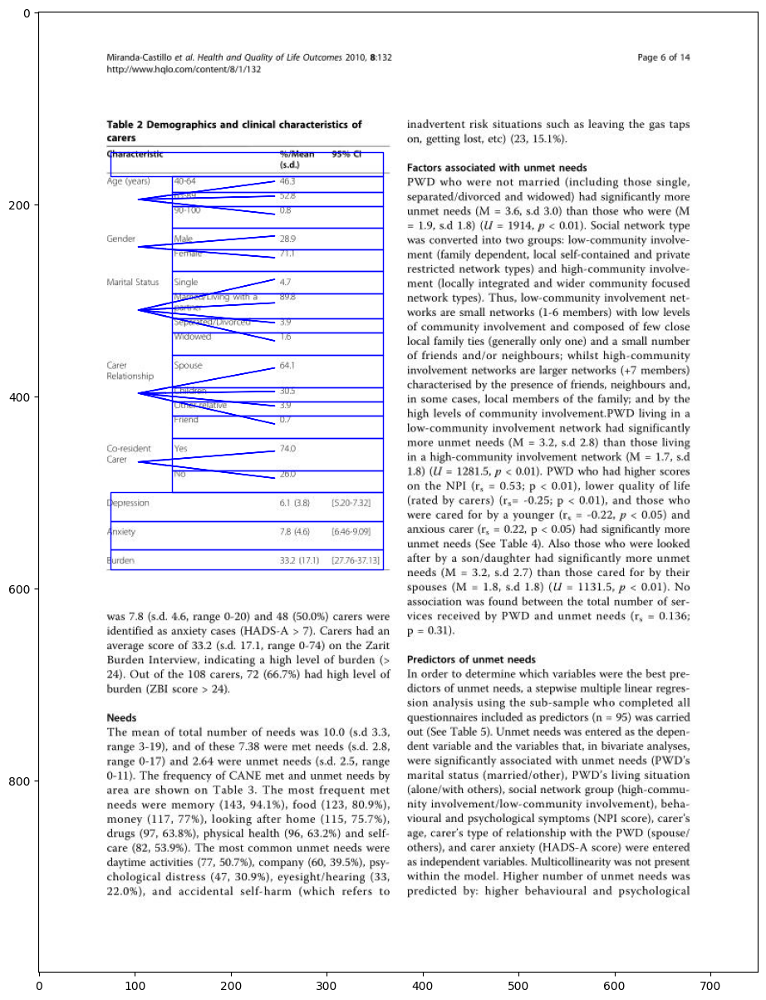

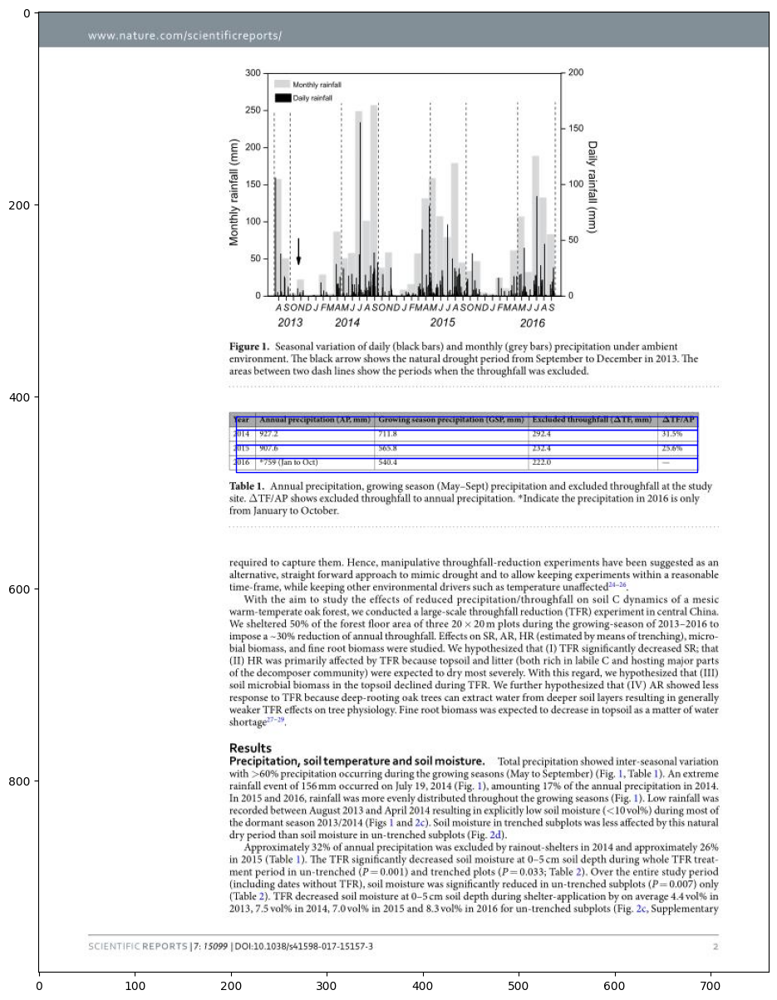

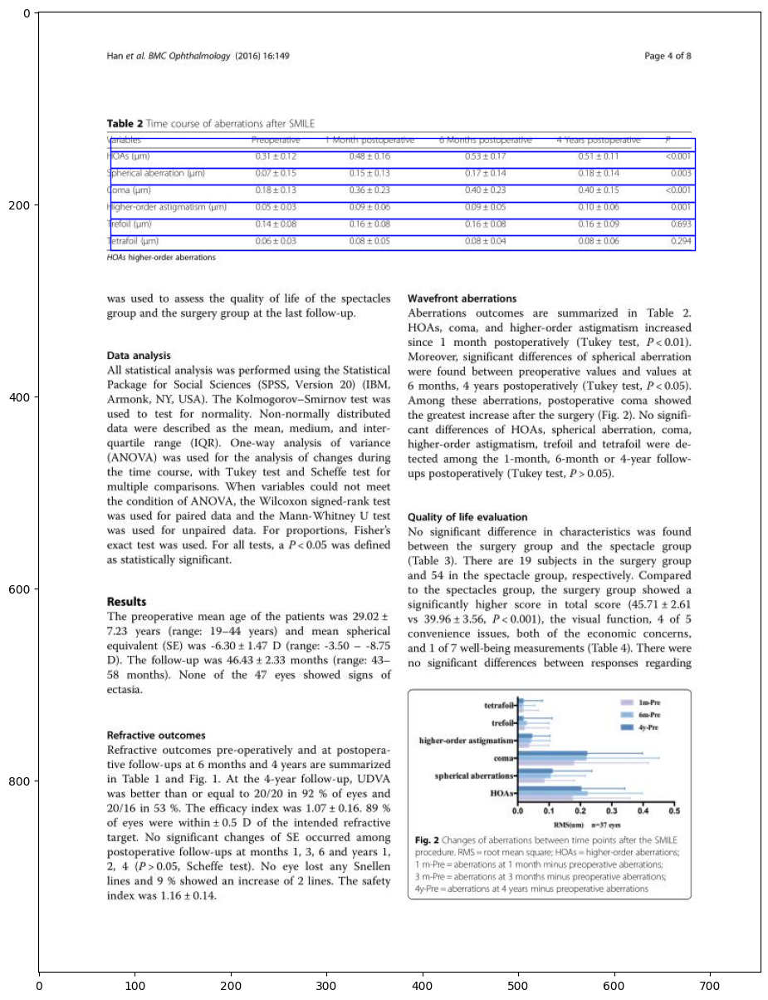

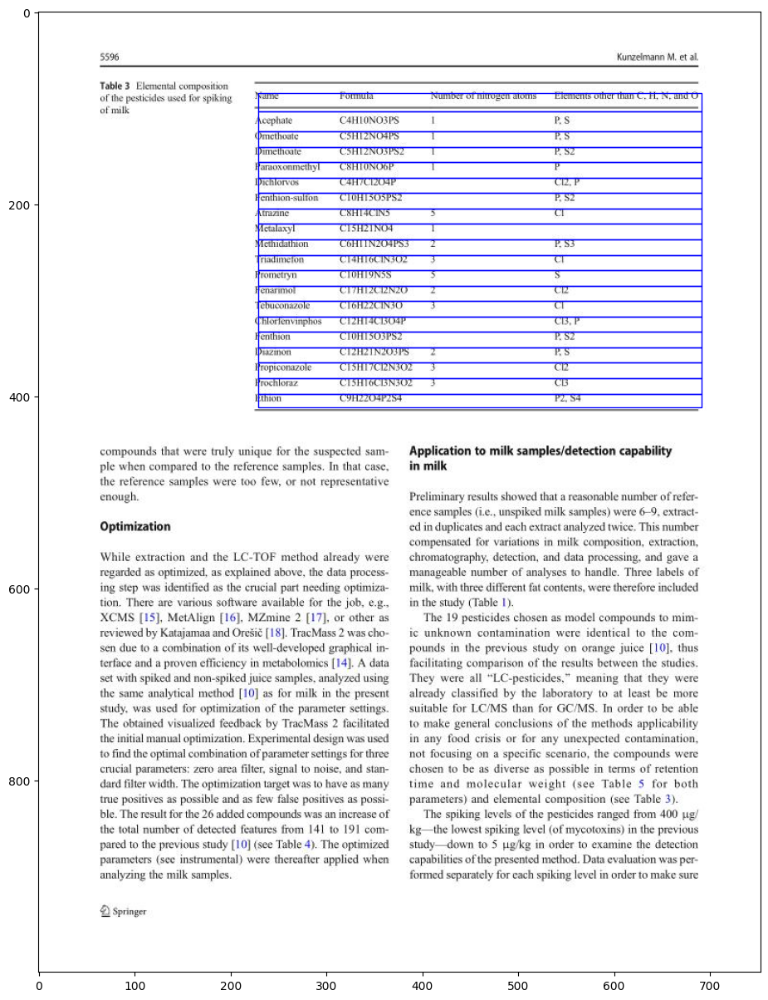

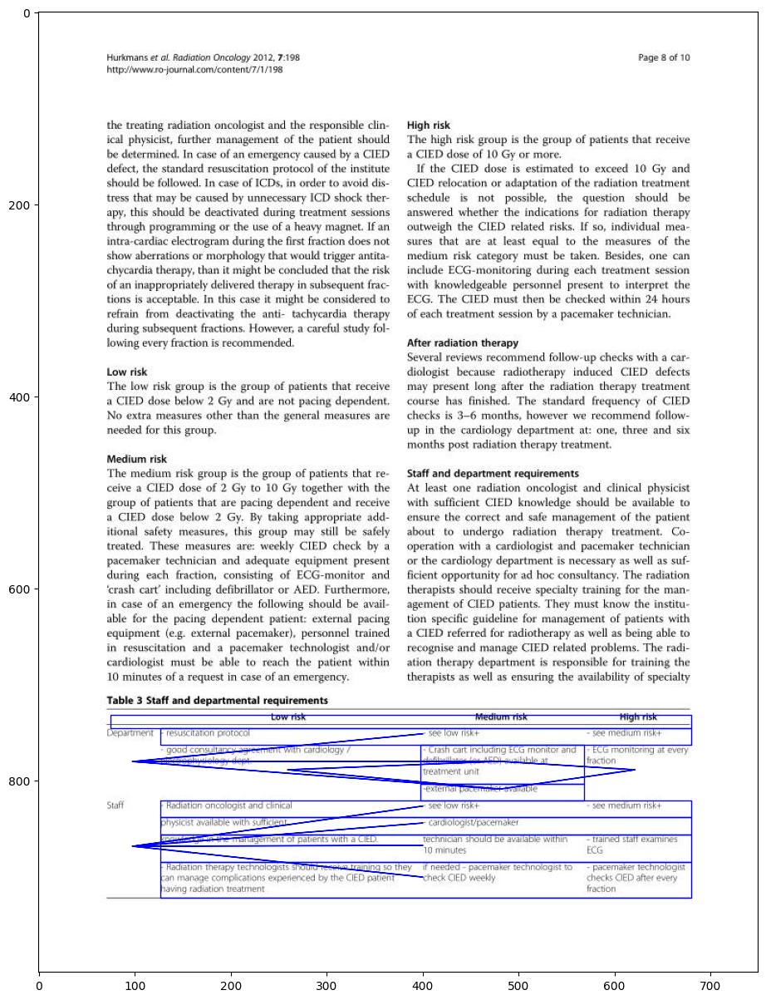

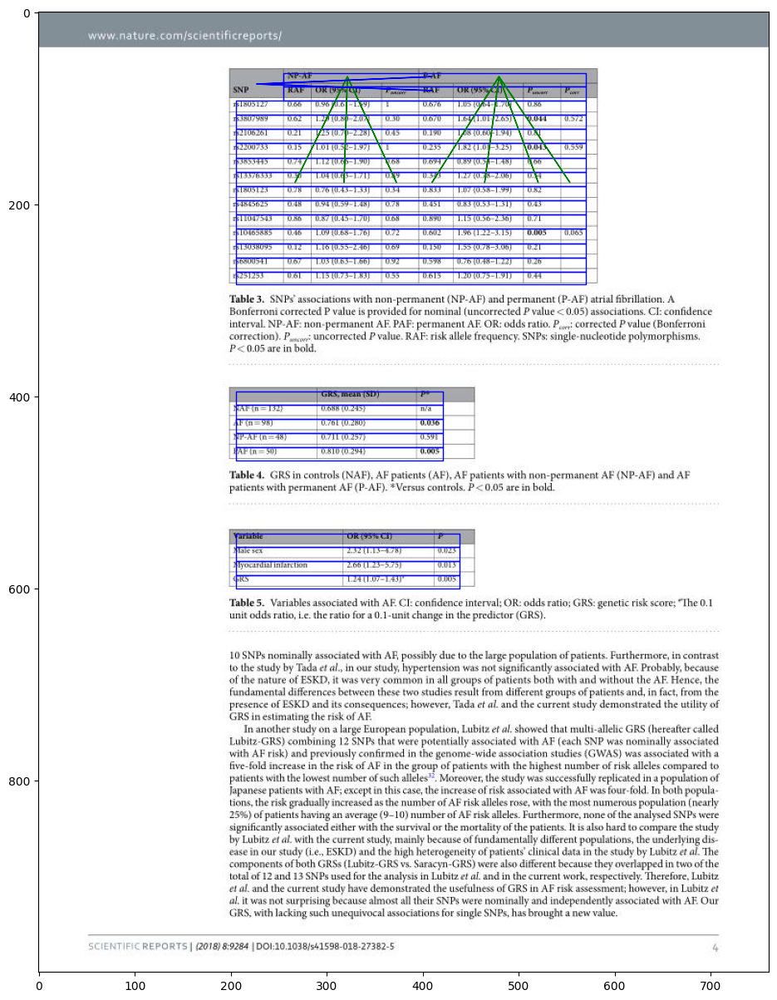

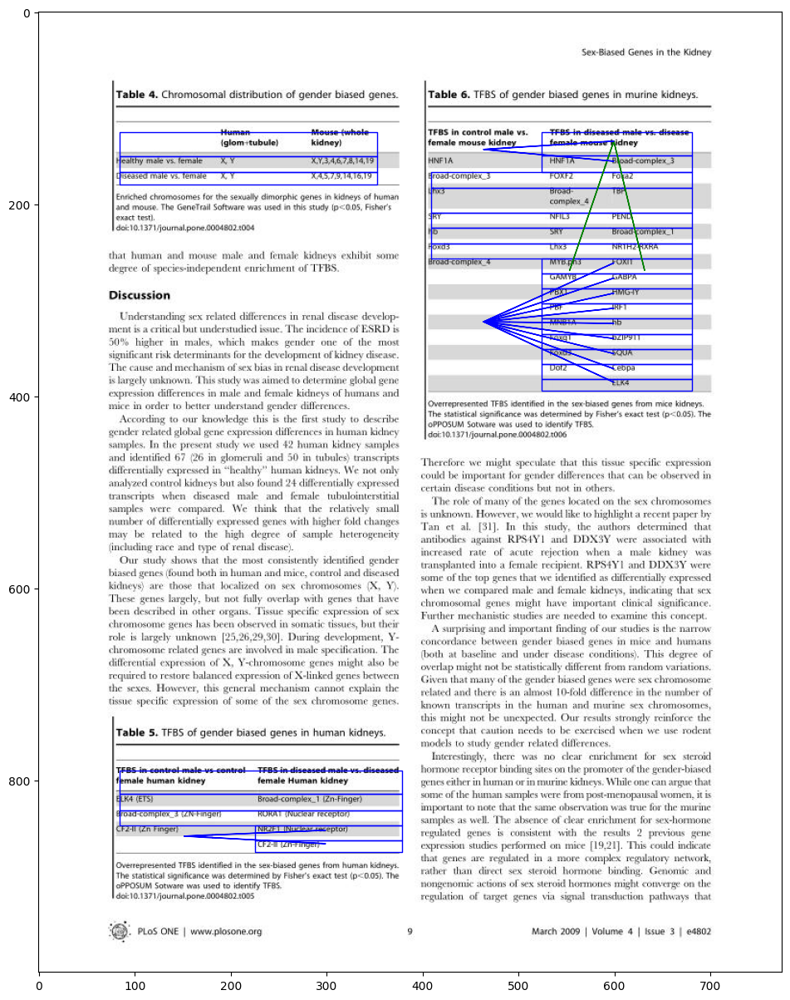

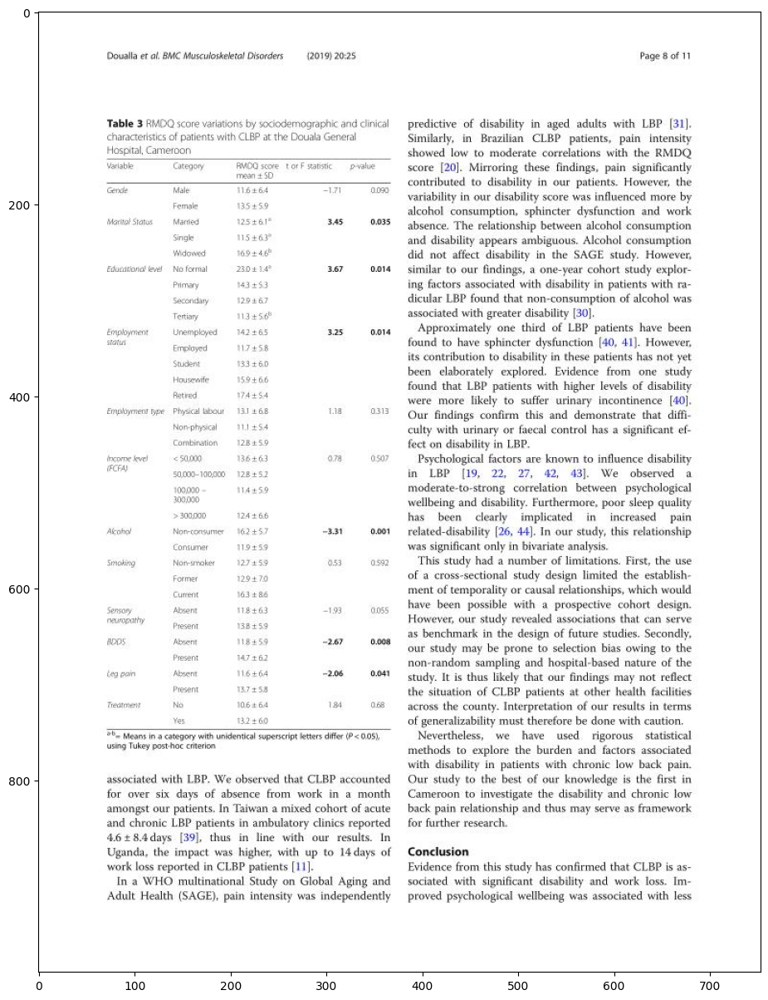

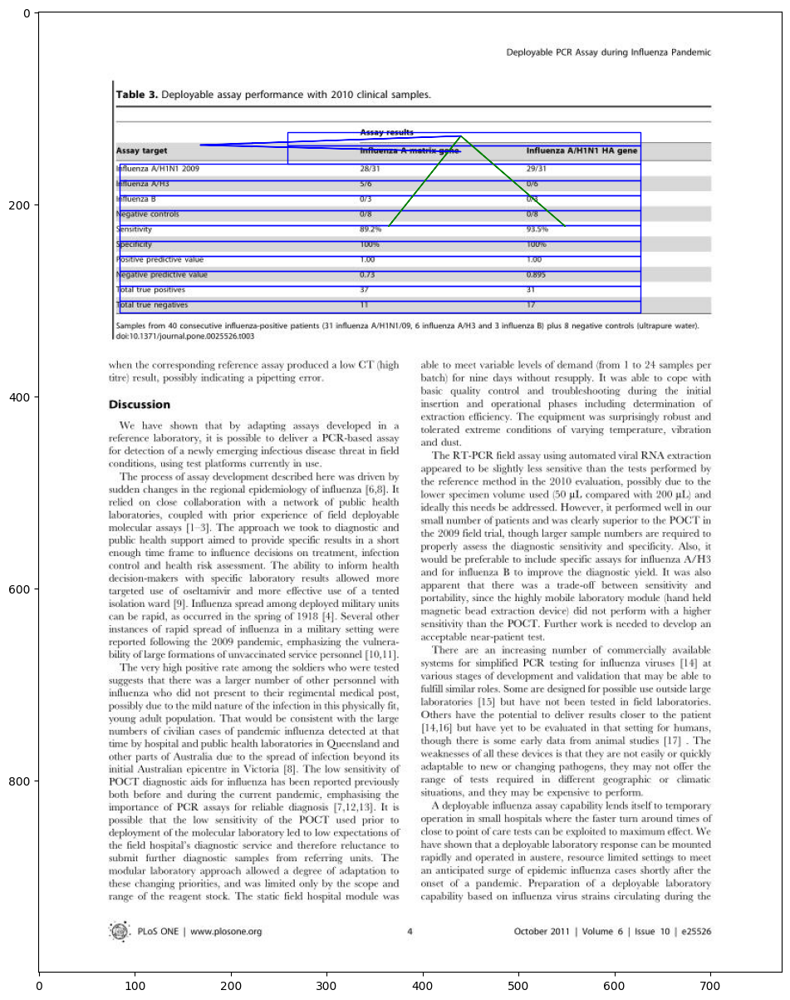

In [13]:
# Labels visualization for table detection + recognition with correspondance dict

import os
import sys
import json
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle, Polygon
from matplotlib.collections import PatchCollection
from PIL import Image
import xml.etree.ElementTree as ET
import glob
from collections import defaultdict
from tqdm import tqdm



with open('/data/D069325/pytorch32/line-based-bocr/td_to_tr_matching_ocr_gt.json', 'r', encoding="utf8") as f:
    td_to_tr_matching = json.load(f)

# with open('/data/D069325/pytorch32/line-based-bocr/tr_to_td_matching_ocr_gt.json', 'r', encoding="utf8") as f:
#     tr_to_td_matching = json.load(f)

is_one_model = True
dataset_type = 'train'

class_map = {'table': 0,
             'column': 1,
             'row': 2,
             'header': 3,
             'spanning cell': 4}


def read_json(json_file: str, class_map=None):
    with open(json_file, 'r') as openfile:
        data = json.load(openfile)
    width, height = data['image_size']
    bboxes = []
    labels = []
    cell_pointers = []

    for label in data['labels']:
        label_name = label['name']
        bbox = label['bbox']
        cell_pointer = label.get('extra_cells', None)

        if label_name == 'table rotated':
            label_name = 'table'

        if class_map.get(label_name, None) is None:
            continue

        label_id = int(class_map[label_name])
        bboxes.append(bbox)
        labels.append(label_id)
        cell_pointers.append(cell_pointer)

    return bboxes, labels, cell_pointers, [width, height]


def map_tr_on_td_dataset_point(root, page_id, bboxes, labels, cell_pointers):
    shadow_mask = 1
    if 'PubTables1M-Detection-PASCAL-VOC' in root and is_one_model:
        corresponding_tr_ids = td_to_tr_matching.get(page_id, None)
        if corresponding_tr_ids is not None:
            root_tr = root.replace('PubTables1M-Detection-PASCAL-VOC', 'PubTables1M-Structure-PASCAL-VOC')
            for tr_idx, table_id in enumerate(corresponding_tr_ids):
                bs_tr, ls_tr, structure_cell_pointers, image_size_tr = read_json(os.path.join(root_tr, dataset_type, table_id + '.json'), class_map)
                table_label_index = ls_tr.index(0)
                box_tr_reference = bs_tr[table_label_index]

                for b, l, cp in zip(bs_tr, ls_tr, structure_cell_pointers):
                    if l == 0:
                        continue
                    box_tr_mapped = [b[0] + bboxes[tr_idx][0] - box_tr_reference[0], b[1] + bboxes[tr_idx][1] - box_tr_reference[1],
                                     b[2] + bboxes[tr_idx][0] - box_tr_reference[0], b[3] + bboxes[tr_idx][1] - box_tr_reference[1]]
                    bboxes.append(box_tr_mapped)
                    labels.append(l)
                    new_cp = None
                    if cp is not None and cp != []:
                        new_cp = []
                        for cp_single in cp:
                            cp_single_mapped = [cp_single[0] + bboxes[tr_idx][0] - box_tr_reference[0], cp_single[1] + bboxes[tr_idx][1] - box_tr_reference[1],
                                                cp_single[2] + bboxes[tr_idx][0] - box_tr_reference[0], cp_single[3] + bboxes[tr_idx][1] - box_tr_reference[1]]
                            new_cp.append(cp_single_mapped)
                    cell_pointers.append(new_cp)
        else:
            shadow_mask = 0
    return shadow_mask, bboxes, labels, cell_pointers


dataset_path = os.path.join('pubtables-1m', 'pubtables1m', 'PubTables1M-Detection-PASCAL-VOC')

print(len(os.listdir(os.path.join(dataset_path, dataset_type))))

for f in tqdm(os.listdir(os.path.join(dataset_path, dataset_type))[:10]):
    # print(f)
    if f == '.ipynb_checkpoints':
        continue

    file_name = f.split('.')[0]
    annotation_file_path = os.path.join(dataset_path, dataset_type, f)
    bboxes, labels, cell_pointers, size = read_json(annotation_file_path, class_map)

    image_path = os.path.join(dataset_path, dataset_type, '..', 'images', file_name + '.jpg')
    if not os.path.exists(image_path):
        image_path = os.path.join(dataset_path, dataset_type, '..', 'images', file_name + '.png')

    im = Image.open(image_path)
    fig, ax = plt.subplots(figsize=(30, 15))
    ax.imshow(im)
    header_rects = []
    row_rects = []
    col_rects = []
    table_rects = []
    cell_rects = []
    col_arrows = []
    row_arrows = []

    shadow_mask, bboxes, labels, cell_pointers = map_tr_on_td_dataset_point(dataset_path, file_name, bboxes, labels, cell_pointers)
    for idx, bbox in enumerate(bboxes):
        shift = 0
        if labels[idx] > 0:
            shift = labels[idx] + 1
        rect = Polygon(np.asarray([[bbox[0] + shift, bbox[1] + shift], [bbox[2] + shift, bbox[1] + shift],
                                   [bbox[2] + shift, bbox[3] + shift], [bbox[0] + shift, bbox[3] + shift]]).reshape(-1, 2))
        if labels[idx] == 0:
            table_rects.append(rect)
        elif labels[idx] == 1:
            col_rects.append(rect)
        elif labels[idx] == 2:
            row_rects.append(rect)
        elif labels[idx] == 3:
            header_rects.append(rect)
        elif labels[idx] == 4:
            cell_rects.append(rect)

        if labels[idx] == 1:
            if cell_pointers[idx]:
                for dst_cell in cell_pointers[idx]:
                    if dst_cell:
                        dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                        dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                        column_x_center = (bbox[0] + bbox[2]) / 2.0
                        column_y_center = (bbox[1] + bbox[3]) / 2.0
                        arrow = Arrow(column_x_center, column_y_center, dst_cell_x_center-column_x_center, dst_cell_y_center-column_y_center)
                        col_arrows.append(arrow)

        if labels[idx] == 2:
            if cell_pointers[idx]:
                for dst_cell in cell_pointers[idx]:
                    if dst_cell:
                        dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                        dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                        row_x_center = (bbox[0] + bbox[2]) / 2.0
                        row_y_center = (bbox[1] + bbox[3]) / 2.0
                        arrow = Arrow(row_x_center, row_y_center, dst_cell_x_center-row_x_center, dst_cell_y_center-row_y_center)
                        row_arrows.append(arrow)

    ax.add_collection(PatchCollection(table_rects, facecolor='none', edgecolor='red', linewidth=1))
    ax.add_collection(PatchCollection(row_rects, facecolor='none', edgecolor='blue', linewidth=1))
    ax.add_collection(PatchCollection(col_rects, facecolor='none', edgecolor='green', linewidth=1))
    # ax.add_collection(PatchCollection(header_rects, facecolor='none', edgecolor='orange', linewidth=2))
    ax.add_collection(PatchCollection(cell_rects, facecolor='none', edgecolor='red', linewidth=1))

    ax.add_collection(PatchCollection(col_arrows, facecolor='none', edgecolor='green'))
    ax.add_collection(PatchCollection(row_arrows, facecolor='none', edgecolor='blue'))
